In [431]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import re

os.chdir('/Users/Valerie/Desktop/Rental')

df = pd.read_csv('results_full.csv', sep=",", header = 0, encoding = 'utf-8')

Deleting duplicated ads (some could be pinned on the top of a few pages) using the link column:

In [432]:
data = df.drop_duplicates(subset=['Link'], keep='first')
data.reset_index(drop=True, inplace=True)

Analysing each column and cleaning the data 

In [433]:
data['Neighbourhood'].unique()

array(['Śródmieście', 'Bielany', 'Mokotów', 'Ursynów', 'Praga-Północ',
       'Praga-Południe', 'Wola', 'Białołęka', 'Ursus', 'Włochy', 'Bemowo',
       'Targówek', 'Żoliborz', 'Ochota', 'Wilanów', 'Wesoła',
       'warszawski zachodni', 'Wawer', 'Rembertów'], dtype=object)

In [434]:
data = data[~data['Neighbourhood'].isin(['warszawski zachodni'])]

Removing all characters starting from '/' in the 'Floor' column

In [435]:
data['Floor'].unique()

array(['3/11', '2/6', '4/11', '6/6', '4/6', '2', '2/4', '1/3', '> 10/15',
       'parter', '1/6', '2/11', 'parter/4', '3/3', '3/7', '4/7', '2/5',
       '1/4', '3/5', '2/3', '1/5', '5/5', '5', '> 10/11', '2/7', '4/9',
       '4/5', '2/2', '2/8', '4/8', '6/7', 'parter/6', '7/7', '4/4', '5/6',
       '> 10/22', '1/8', '6/9', 'parter/3', '3/6', '5/10', '1',
       'parter/5', '10/22', '8/9', '> 10/18', '5/7', 'suterena',
       '> 10/52', '> 10/17', '3/4', '3', '5/8', '9/11', '7/15', '6', nan,
       '7', '8/11', '6/23', '> 10/16', '4', '> 10/25', '7/12', '5/9',
       '1/10', '7/10', '6/8', '3/10', '2/10', '5/11', '3/8', '4/10',
       '1/7', '9/9', '8/8', '4/12', '8/15', '9/10', '1/2', '7/25', '6/10',
       '8/10', 'parter/2', '> 10/50', '1/14', '7/8', '9', '10/10', '2/13',
       '1/1', '1/16', 'parter/10', '8/12', '3/12', '10/11', 'parter/7',
       '6/11', '6/18', '3/13', '> 10/14', '> 10/27', '> 10/24', '> 10/26',
       '> 10/44', '> 10/13', '2/12', '10/17', '5/15', '2/16', '9/13'

In [ ]:
data['Floor'] = data['Floor'].str.replace(r'/.*', '')

In [437]:
data['Floor'].unique()

array(['3', '2', '4', '6', '1', '> 10', 'parter', '5', '7', '10', '8',
       'suterena', '9', nan, 'poddasze'], dtype=object)

In [438]:
print(data['Floor'].isna().sum())
print(data['Floor'].isin(['poddasze']).sum())

175
1


Encoding 'parter' and 'suterena' as 0 and -1 respectively;
deleting irrelevant values:

In [440]:
data['Floor'] = data['Floor'].str.replace(r'Parter', '0', case=False)
data['Floor'] = data['Floor'].str.replace(r'Suterena', '-1', case=False)
data = data[~data['Floor'].isin(['poddasze'])]
#data = data[~data['Floor'].isna()]

Defining which columns should contain only numeric values, replacing all non-digit characters in the numeric columns and transforming each value to numeric:

In [441]:
numeric_columns = ['Price', 'Area', 'Rooms', 'Floor', 'Rent']

In [442]:
data[numeric_columns] = data[numeric_columns].apply(lambda x: x.str.replace(',', '.', regex=True))
data[numeric_columns] = data[numeric_columns].apply(lambda x: x.str.replace(r'[^0-9.,]', '', regex=True))
data[numeric_columns] = data[numeric_columns].apply(lambda x: pd.to_numeric(x, errors = 'coerce'))

In [444]:
data

,Neighbourhood,Price,Area,Rooms,Furniture,Building,Floor,Rent,Latitude,Longitude,Adress,Link
0,Śródmieście,2999.0,27.15,1,NaN,apartamentowiec,3.0,NaN,52.251517,20.994202,"ul. Stanisława Dubois, Muranów, Śródmieście, W...",https://otodom.pl/pl/oferta/studio-bezposredni...
1,Bielany,2200.0,34.00,1,NaN,blok,2.0,2200.0,52.273979,20.907714,"ul. Księżycowa 58, Chomiczówka, Bielany, Warsz...",https://otodom.pl/pl/oferta/bielany-chomiczowk...
2,Mokotów,3100.0,24.00,1,NaN,blok,4.0,4200.0,52.178482,21.030110,"Pohoskiego 1, Ksawerów, Mokotów, Warszawa, maz...",https://otodom.pl/pl/oferta/kawalerka-bez-prow...
3,Śródmieście,4400.0,45.00,2,NaN,apartamentowiec,6.0,5000.0,52.233130,21.019000,"Śródmieście Północne, Śródmieście, Warszawa, m...",https://otodom.pl/pl/oferta/apartament-solec-r...
4,Ursynów,7900.0,120.00,4,NaN,apartamentowiec,4.0,8500.0,52.137850,21.029120,"Alterntywy, Pyry, Ursynów, Warszawa, mazowieckie",https://otodom.pl/pl/oferta/wysoki-standard-me...
...,...,...,...,...,...,...,...,...,...,...,...,...
7076,Wola,2950.0,50.00,2,NaN,apartamentowiec,1.0,NaN,52.234752,20.959559,"ul. Sokołowska, Młynów, Wola, Warszawa, mazowi...",https://otodom.pl/pl/oferta/komfortowe-2-pokoj...
7077,Śródmieście,5500.0,62.00,3,NaN,NaN,1.0,NaN,52.227564,21.018031,"Śródmieście Południowe, Śródmieście, Warszawa,...",https://otodom.pl/pl/oferta/mieszkanie-62-m-wa...
7078,Śródmieście,13000.0,145.00,4,NaN,apartamentowiec,4.0,NaN,52.209306,21.030407,"ul. Lądowa, Ujazdów, Śródmieście, Warszawa, ma...",https://otodom.pl/pl/oferta/4-pok-przy-lazienk...
7079,Wola,3000.0,38.02,1,NaN,blok,3.0,NaN,52.238920,20.993432,"ul. Elektoralna, Mirów, Wola, Warszawa, mazowi...",https://otodom.pl/pl/oferta/duze-studio-w-samy...


Expanding data from an adress column into few columns to extract the 'MSI obszar' column for more precise analysis:

* MSI (Miejski System Informacyjny) - the division of the areas into smaller units

In [445]:
data_expanded = data['Adress'].str.split(', ', expand=True)

In [446]:
data = pd.concat([data, data_expanded], axis=1)

Defining 'Miejski System Informacyjny' areas list

#MSI will be later excluded from the regression model due to the overfitting issues.

In [447]:
msi = ["Czechowice", "Gołąbki", "Niedźwiadek", "Skorosze", "Szamoty", "Dąbrówka", "Grabów", "Jeziorki Północne", 
"Jeziorki Południowe", "Kabaty", "Natolin", "Pyry", "Skarpa Powsińska", "Stary Służew", "Stary Imielin", 
"Las Kabacki", "Ursynów-Centrum", "Ursynów Północny", "Wyczółki", "Groszówka", 
"Plac Wojska Polskiego", "Stara Miłosna", "Wesoła-Centrum", "Wola Grzybowska", "Zielona-Grzybowa", "Aleksandrów",
"Anin", "Falenica", "Las", "Marysin Wawerski", "Miedzeszyn", "Międzylesie", "Nadwiśle", "Radość", "Sadul", "Wawer",
"Zerzeń", "Nowe Włochy", "Okęcie", "Opacz Wielka", "Paluch", "Raków", "Salomea", "Stare Włochy", "Załuski", "Augustówka", 
"Czerniaków", "Ksawerów", "Służew", "Służewiec", "Sadyba", "Siekierki", "Sielce", "Stary Mokotów", "Stegny", "Wierzbno", 
"Wyględów", "Filtry", "Rakowiec", "Stara Ochota", "Szczęśliwice", "Czyste", "Koło", "Młynów", "Mirów", "Nowolipki", "Odolany", 
"Powązki", "Ulrychów", "Bemowo-Lotnisko", "Boernerowo", "Chrzanów", "Fort Bema", "Fort Radiowo", "Górce", "Groty", 
"Jelonki Północne", "Jelonki Południowe", "Lotnisko", "Muranów", "Nowe Miasto", "Powiśle", "Solec", "Stare Miasto", 
"Śródmieście Północne", "Śródmieście Południowe", "Ujazdów", "Kawęczyn-Wygoda", "Nowy Rembertów", "Stary Rembertów", 
"Białołęka Dworska", "Brzeziny", "Choszczówka", "Dąbrówka Szlachecka", "Grodzisk", "Henryków", "Kobiałka", "Nowodwory", 
"Szamocin", "Tarchomin", "Żerań", "Nowa Praga", "Pelcowizna", "Stara Praga", "Szmulowizna", "Gocław", "Gocławek", "Grochów", 
"Kamionek", "Olszynka Grochowska", "Saska Kępa", "Elsnerów", "Bródno", "Bródno-Podgrodzie", "Targówek Fabryczny", "Targówek Mieszkaniowy", 
"Zacisze", "Utrata", "Żoliborz", "Marymont-Potok", "Stary Żoliborz", "Sady Żoliborskie", "Chomiczówka", "Huta", 
"Las Bielański", "Młociny", "Marymont-Kaskada", "Marymont-Ruda", "Piaski", "Placówka", "Radiowo", "Słodowiec", "Stare Bielany", "Wólka Węglowa",
"Wawrzyszew", "Wrzeciono", "Wilanów Wysoki", "Wilanów Niski", "Wilanów Królewski",  "Błonia Wilanowskie",  "Powsinek",  
"Zawady",  "Kępa Zawadowska",  "Powsin"
]

In [448]:
data.reset_index(drop=True, inplace = True)

Checking if there is any irrelevant data in the column with msi areas:

In [449]:
print(data.iloc[[i not in msi for i in data[1]]])

     Neighbourhood   Price   Area  Rooms  Furniture          Building  Floor  \
3      Śródmieście  4400.0   45.0      2        NaN   apartamentowiec    6.0   
15         Ursynów  3100.0   52.1      2        NaN              blok    0.0   
35          Ochota  4900.0   70.0      3        NaN   apartamentowiec    2.0   
39     Śródmieście  8700.0  115.0      3        NaN   apartamentowiec    3.0   
40         Mokotów  2900.0   65.0      3        NaN              blok    6.0   
...            ...     ...    ...    ...        ...               ...    ...   
7023        Wesoła  9900.0  360.0      6        NaN  dom wolnostojący    NaN   
7026   Śródmieście  7000.0   55.0      2        NaN         kamienica    4.0   
7044   Śródmieście  4900.0   56.0      2        NaN               NaN    4.0   
7071   Śródmieście  5500.0   62.0      3        NaN               NaN    1.0   
7074        Bemowo  2400.0    4.0      1        NaN   apartamentowiec    0.0   

        Rent   Latitude  Longitude  ...

Due to the non-unified system of providing the adress some values are placed in the different columns, therefore we have to create a function which would find the correct values and return them to the MSI column:

In [450]:
def search_msi(row):
    if row[0] in msi:
        return row[0]
    elif row[2] in msi:
        return row[2]
    else:
        return row[1]

data[1] = data.apply(search_msi, axis=1)

Checking if there is still any irrelevant data:

In [451]:
print(data[[0, 1]].iloc[[i not in msi for i in data[1]]])

                                                      0                1
73                 ul. Batalionu AK Karpaty ,Czerniaków          Mokotów
77                                          Tyniecka 28  02-615 Warszawa
160                   ul. Jana Bytnara Rudego ,Wierzbno          Mokotów
327                       al. Aleja Solidarności ,Mirów             Wola
761                   ul. Dywizjonu AK Jeleń ,Siekierki          Mokotów
772                   ul. Dywizjonu AK Jeleń ,Siekierki          Mokotów
816                                        Moje Miejsce             None
1018                      al. Aleja Solidarności ,Mirów             Wola
1128                    ul. Grupy AK Północ ,Czerniaków          Mokotów
1143                  ul. Dywizjonu AK Jeleń ,Siekierki          Mokotów
1311      ul. gen. Augusta Emila Fieldorfa Nila ,Gocław   Praga-Południe
1434                    al. Aleja Solidarności ,Muranów      Śródmieście
1617                    al. Aleja Solidarności ,Mur

Taking msi from column with a street name:

In [452]:
def extract_location(row):
    try: 
        return row[0].split(',')[1] if row[1] not in msi else row[1]
    except: 
        return row[1]

In [453]:
data[1] = data.apply(extract_location, axis=1)

In [ ]:
print(data.iloc[[i not in msi for i in data[1]]])

2 incorrect rows left: changing data in one row and deliting another row 

In [ ]:
data.drop([77, 816], inplace=True)
data[1][3214] = "Wyględów"

Removing unnecessary columns and renaming MSI column:

In [458]:
data = data.drop(columns = [0, 2, 3, 4, 5, 6, 7, 8])
data.rename(columns={1: 'MSI'}, inplace=True)
data.reset_index(drop=True, inplace=True)

Cleaning the Price column

In [459]:
data['Price'].describe()

count     7073.000000
mean      5631.434099
std       5141.808132
min        300.000000
25%       3000.000000
50%       3990.000000
75%       5900.000000
max      50000.000000
Name: Price, dtype: float64

Minimum value is unrealisticly low: there probably are advertisements of rooms, not flats in the dataset.
Let's check 20 lowest values:

In [460]:
result = "\n".join([f"{data.sort_values(by='Price')['Link'].iloc[i]} {data.sort_values(by='Price')['Price'].iloc[i]}" for i in range(20)])
print(result)

https://otodom.pl/pl/oferta/parking-miejsce-postojowe-garaz-ul-konstruktorska-ID4pwHi 300.0
https://otodom.pl/pl/oferta/luksusowy-apartament-103m2-z-4-pokoje-ID4pR7P 450.0
https://otodom.pl/pl/oferta/mieszkanie-42-m-warszawa-ID4pO1i 1400.0
https://otodom.pl/pl/oferta/mieszkanie-taniej-o-1000zl-w-zamian-za-prace-ID4pEoa 1500.0
https://otodom.pl/pl/oferta/pokoj-18m-400m-od-metra-trocka-zacisze-ID4pFgr 1500.0
https://otodom.pl/pl/oferta/kawalerka-w-dzielnicy-wesola-w-warszawie-ID4pHWj 1500.0
https://otodom.pl/pl/oferta/pokoj-12-5-m2-do-wynajecia-na-bemowie-ID4pGUl 1500.0
https://otodom.pl/pl/oferta/kondratowicza-18-targowek-2-pokoje-garaz-ochrona-ID4pOvL 1500.0
https://otodom.pl/pl/oferta/kawalerka-przy-metro-kondratowicza-ID4pNDb 1549.0
https://otodom.pl/pl/oferta/pokoj-z-wlasna-oddzielna-garderoba-lazurowa-ID4pxCk 1600.0
https://otodom.pl/pl/oferta/piekna-kawalerka-dla-singla-niedaleko-metra-ID4kNqd 1650.0
https://otodom.pl/pl/oferta/kawalerka-na-starym-miescie-ulica-brzozowa-ID4pwmK 16

The cheapest flat costs 1400 monthly, therefore we delete lower values:

In [461]:
data = data.sort_values(by = 'Price')
data = data[data['Price']>1350]
data.reset_index(drop=True, inplace=True)

In [462]:
data['Link']=data['Link'].astype(str)

Looking for links which contain "pokoj-" or "pokoje-dla-studentow", but do not contain "1-pokoj-", "mieszkanie", "kawalerka", "spokoj", "kuchnia" - to exclude links with "pokoj-z-osobna-kuchia" or "mieszkanie-1-pokoj" f.e.

In [463]:
pokoje = data[data['Link'].str.contains("pokoj-|pokoje-dla-studentow") & ~data['Link'].str.contains("1-pokoj-|mieszkanie|kawalerka|spokoj|kuchnia")].index

In [464]:
pokoje

Int64Index([2, 4, 7, 17, 27, 1563], dtype='int64')

In [465]:
data = data.drop(pokoje)

In [466]:
data['Area'].describe()

count    7065.000000
mean       61.852062
std        49.887958
min         4.000000
25%        40.000000
50%        51.000000
75%        70.000000
max      3000.000000
Name: Area, dtype: float64

In [474]:
print(data[['Link', 'Area']].sort_values(by = 'Area').head(10))


                                                  Link  Area
211  https://otodom.pl/pl/oferta/kawalerka-na-polu-...  15.0
279  https://otodom.pl/pl/oferta/bezposrednio-studi...  15.0
436  https://otodom.pl/pl/oferta/mikromieszkanie-1-...  15.5
275  https://otodom.pl/pl/oferta/kawalerka-pole-mok...  15.5
124  https://otodom.pl/pl/oferta/kawalerka-na-stare...  16.0
125  https://otodom.pl/pl/oferta/mieszkanie-kawaler...  16.0
93   https://otodom.pl/pl/oferta/mieszkanie-kawaler...  16.0
156  https://otodom.pl/pl/oferta/nowa-i-sloneczna-w...  17.0
57   https://otodom.pl/pl/oferta/kawalerka-wrzecono...  17.0
465  https://otodom.pl/pl/oferta/kawalerka-stare-wl...  17.0


In [475]:
print(data[['Link', 'Area']].sort_values(by = 'Area').tail(10))

                                                   Link   Area
6802  https://otodom.pl/pl/oferta/apartament-280-m2-...  280.0
7043  https://otodom.pl/pl/oferta/luksusowy-appt-284...  284.0
6778  https://otodom.pl/pl/oferta/fenomenalny-artyst...  300.0
6601  https://otodom.pl/pl/oferta/dom-6pok-ursynow-g...  350.0
6947  https://otodom.pl/pl/oferta/luksusowy-apartame...  350.0
6949  https://otodom.pl/pl/oferta/5-sypialni-miejsca...  350.0
6950  https://otodom.pl/pl/oferta/apartament-na-doln...  350.0
6939  https://otodom.pl/pl/oferta/luxury-apartment-g...  350.0
6943  https://otodom.pl/pl/oferta/luksusowy-apartame...  350.0
6257  https://otodom.pl/pl/oferta/dom-w-starej-milos...  360.0


In [473]:
data = data.drop([396, 47, 10, 2286, 531])
data.reset_index(drop=True, inplace=True)

Visualizing Price values distribution

Text(0.5, 1.0, 'Rent Prices')

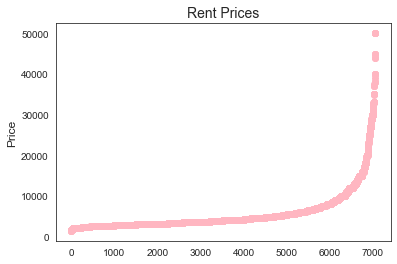

In [476]:
import seaborn as sns
sns.set_style('white')
plt.scatter(x=data.index, y = data['Price'], color = 'lightpink')
plt.ylabel('Price', fontsize=12)
plt.title('Rent Prices', fontsize=14)

/var/folders/h3/rfp4nl35635g_86dvwb559dc0000gn/T/ipykernel_73372/2460030499.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=data['Price'], bins=20, color = 'lightpink')


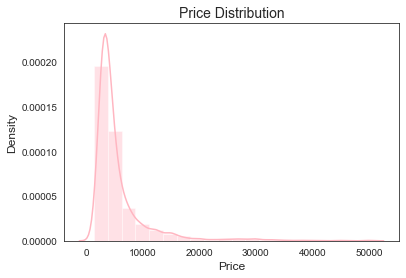

In [477]:
sns.distplot(x=data['Price'], bins=20, color = 'lightpink')
plt.xlabel('Price', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.title('Price Distribution', fontsize=14)
plt.show()

Very high prices could indicate large area flats. 
Creating new variable calculating the price of 1m^2

In [478]:
data['price/m'] = data['Price']/data['Area']

Text(0.5, 1.0, 'price/squared_m')

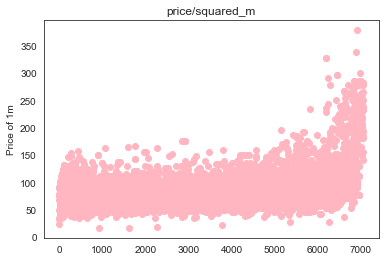

In [479]:
plt.scatter(data.index, data['price/m'], color = 'lightpink')
plt.ylabel("Price of 1m")
plt.title("price/squared_m")

In [480]:
data.reset_index(drop=True, inplace=True)

checking the lowest values:

In [481]:
print(data.sort_values(by='price/m').head(10))

       Neighbourhood   Price   Area  Rooms  Furniture          Building  \
924          Bielany  2700.0  161.0      4        NaN   apartamentowiec   
1622         Mokotów  3000.0  175.0      5        NaN   apartamentowiec   
2267         Mokotów  3250.0  177.0      4        NaN   apartamentowiec   
3776           Wawer  4000.0  180.0      4        NaN               NaN   
1     Praga-Południe  1500.0   65.0      2        NaN         kamienica   
6257          Wesoła  9900.0  360.0      6        NaN  dom wolnostojący   
5346          Ochota  6000.0  218.0      8        NaN              blok   
0           Targówek  1400.0   42.0      2        NaN   apartamentowiec   
470             Wola  2500.0   73.0      3        NaN              blok   
655             Wola  2500.0   73.0      2        NaN              blok   

      Floor    Rent   Latitude  Longitude  \
924     3.0     NaN  52.311005  20.934972   
1622    2.0  9000.0  52.185278  21.070849   
2267    3.0     NaN  52.170620  21.0666

In [492]:
data.iloc[924]['Link']
data.iloc[1622]['Link']
data.iloc[2267]['Link']


Neighbourhood                                              Mokotów
Price                                                      13942.5
Area                                                         177.0
Rooms                                                            4
Furniture                                                      NaN
Building                                           apartamentowiec
Floor                                                          3.0
Rent                                                           NaN
Latitude                                                  52.17062
Longitude                                                 21.06663
Adress           ul. Jana III Sobieskiego, Stegny, Mokotów, War...
Link             https://otodom.pl/pl/oferta/rodzinny-apartamen...
MSI                                                         Stegny
price/m                                                  18.361582
Name: 2267, dtype: object

Values are provided in EUR;
Converting to PLN:

In [493]:
data['Price'][[924, 1622, 2267]] = data['Price'][[924, 1622, 2267]] * 4.29
data['price/m'][[924, 1622, 2267]] = data['price/m'][[924, 1622, 2267]] * 4.29

/var/folders/h3/rfp4nl35635g_86dvwb559dc0000gn/T/ipykernel_73372/2728818645.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['price/m'][[924, 1622, 2267]] = data['price/m'][[924, 1622, 2267]] * 4.29


Checking the highest values:

In [496]:
print(data.sort_values(by='price/m', ascending=False).head(10))

     Neighbourhood    Price   Area  Rooms  Furniture         Building  Floor  \
6921   Śródmieście  25000.0   66.1      2        NaN  apartamentowiec    NaN   
6884          Wola  22000.0   65.0      2        NaN  apartamentowiec   10.0   
6199   Śródmieście   9150.0   28.0      1        NaN  apartamentowiec    NaN   
6200          Wola   9150.0   28.0      1        NaN             blok    NaN   
6982   Śródmieście  30000.0  100.0      2        NaN             blok   10.0   
6453   Śródmieście  11850.0   40.0      2        NaN  apartamentowiec    NaN   
6451          Wola  11850.0   40.0      1        NaN             blok    NaN   
6244   Śródmieście   9600.0   33.0      1        NaN  apartamentowiec    NaN   
6998   Śródmieście  30000.0  105.0      2        NaN             blok   10.0   
6834   Śródmieście  18000.0   63.0      2        NaN              NaN   10.0   

         Rent   Latitude  Longitude  \
6921      NaN  52.231280  21.002500   
6884  44000.0  52.230315  20.999931   
61

In [498]:
data.iloc[6199]['Link']

'https://otodom.pl/pl/oferta/piekne-mieszkanie-w-centrum-warszawy-ID4olRl'

The highest values seem to be ok, (Zlota 44)

Plotting a histogram of price/m

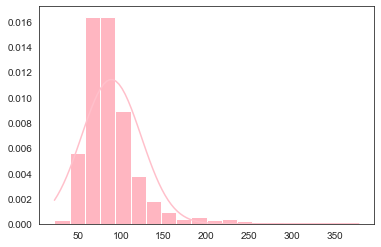

In [499]:
plt.hist(data['price/m'], color = 'lightpink', bins = 20, density = True)
kde = np.linspace(min(data['price/m']), max(data['price/m']), 100)
kde_values = (1 / (data['price/m'].std() * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((kde - data['price/m'].mean()) / data['price/m'].std())**2)

# Plot KDE
plt.plot(kde, kde_values, color='pink', linestyle='-', label='KDE')
plt.show()

Grouping price by Neighbourhood and calculating mean Price and price/m

In [504]:
grouped_price = data[['Neighbourhood', 'Price']].groupby('Neighbourhood').mean()
grouped_price_m = data[['Neighbourhood', 'price/m']].groupby('Neighbourhood').mean()
grouped_price_median = data[['Neighbourhood', 'price/m']].groupby('Neighbourhood').median()

Visualizing the results on a shapemap:

In [501]:
districts = gpd.read_file('dzielnice_Warszawy.dbf', encoding = 'utf-8')

In [502]:
districts

,nazwa_dzie,geometry
0,Żoliborz,"POLYGON ((633539.527 490793.934, 633542.003 49..."
1,Praga-Południe,"POLYGON ((643637.355 486100.653, 643623.409 48..."
2,Mokotów,"POLYGON ((638075.459 484924.185, 638083.540 48..."
3,Wola,"POLYGON ((635178.545 489906.766, 635181.466 48..."
4,Wilanów,"POLYGON ((643831.799 482999.436, 643838.935 48..."
5,Wesoła,"POLYGON ((649656.782 487878.522, 649437.965 48..."
6,Wawer,"POLYGON ((644054.020 482432.971, 644051.556 48..."
7,Włochy,"POLYGON ((631133.767 484862.977, 631146.760 48..."
8,Ursynów,"POLYGON ((635835.113 479216.177, 635867.908 47..."
9,Śródmieście,"POLYGON ((640812.855 485462.412, 640802.548 48..."


In [503]:
districts.rename(columns={'nazwa_dzie': 'Neighbourhood'}, inplace=True)

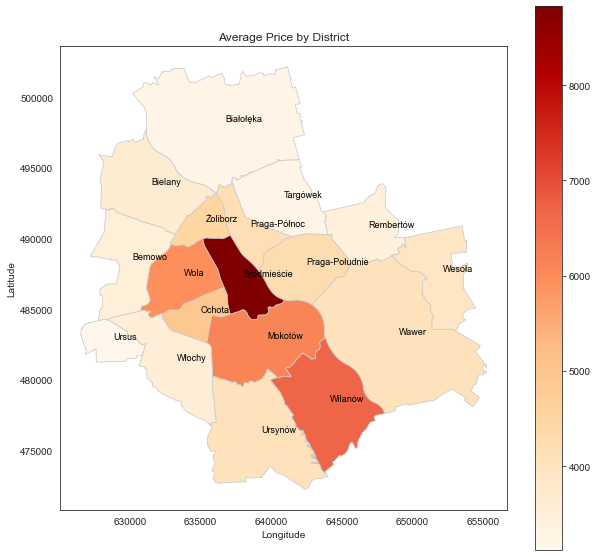

In [505]:
merged_data = pd.merge(grouped_price, districts, on='Neighbourhood')

gdf = gpd.GeoDataFrame(merged_data, geometry='geometry')

fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(column='Price', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

plt.title('Average Price by District')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for x, y, label in zip(districts.geometry.centroid.x, districts.geometry.centroid.y, districts['Neighbourhood']):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points", fontsize=9, color='black')

plt.show()

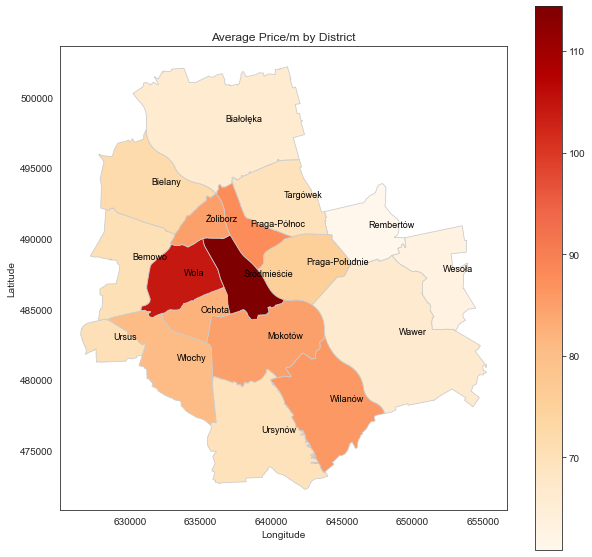

In [896]:
merged_data_m = pd.merge(grouped_price_m, districts, on='Neighbourhood')

gdf = gpd.GeoDataFrame(merged_data_m, geometry='geometry')

fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(column='price/m', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

plt.title('Average Price/m by District')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for x, y, label in zip(districts.geometry.centroid.x, districts.geometry.centroid.y, districts['Neighbourhood']):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points", fontsize=9, color='black')

plt.show()

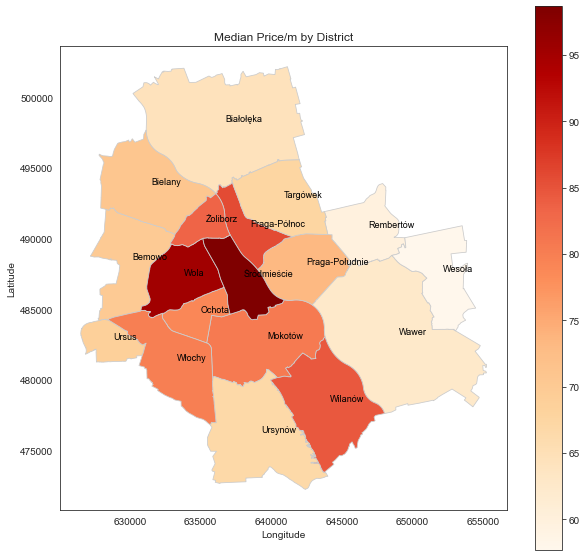

In [895]:
merged_data_median = pd.merge(grouped_price_median, districts, on='Neighbourhood')

gdf = gpd.GeoDataFrame(merged_data_median, geometry='geometry')

fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(column='price/m', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

plt.title('Median Price/m by District')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

for x, y, label in zip(districts.geometry.centroid.x, districts.geometry.centroid.y, districts['Neighbourhood']):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points", fontsize=9, color='black')

plt.show()

Median price shows lower gap between some areas and more informative picture, as it excludes the impact of outliers like Zlota 44 or Park Lane

Creating a map with clickable markers with popups; markers are divided into three price groups, each group has it own color

In [894]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# Creating a map centered at the mean Latitude and Longitude
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=15)

def get_color(price):
    if price <= 2500:
        return 'blue'
    elif price <= 4000:
        return 'green'
    else:
        return 'red'

# Adding clickable markers with popup
for idx, row in data.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']],
                  popup=f"Price: {row['Price']}\n Rent: {row['Rent']}\n Rooms: {row['Rooms']}\n Link: {row['Link']}",
                  z_index_offset=-2000,
                  icon=folium.Icon(color=get_color(row['Price']))).add_to(mymap)


#mymap.save('mymap_final.html')
mymap

Creating a column with distance to the city centre using Google Maps API:

In [512]:
#API_key = *hidden*

In [ ]:
import googlemaps
import ast
from datetime import datetime

# Replace 'YOUR_API_KEY' with your actual API key
gmaps = googlemaps.Client(key=API_key)

# Define the coordinates for the origin and destination
centrum = (52.2318, 21.0060)

data['Location'] = list(zip(data['Latitude'], data['Longitude']))


In [514]:
def data_distance(x, centrum):
    return gmaps.directions(x, centrum, mode="driving", units="metric", departure_time=datetime.now())[0]['legs'][0]['distance']['text']

data['distance_centrum'] = data['Location'].apply(lambda x: data_distance(x, centrum))

In [529]:
data.to_csv('data_with_distancecentrum.csv', index=False, encoding='utf-8')

Calculating distance to the nearest metro station (with Euclidian distance formula) using a dataset with metro stations coordinates:

In [517]:
metro = pd.read_csv("metro_coord.csv", names=['Name', 'Latitude', 'Longitude'])

In [519]:
def nearest(x_lat, x_lon, object):
    calculate_distance = (np.sqrt((x_lat - object['Latitude']) ** 2 + (x_lon - object['Longitude']) ** 2) * 111.319).round(3)
    distance = pd.DataFrame({'distance': calculate_distance, 'name': object['Name']})
    return distance.min()['distance']

In [520]:
data['distance_metro'] = data.apply(lambda row: nearest(row['Latitude'], row['Longitude'], metro), axis=1)

Calculating the distance to the nearest green zone using the same algorythm:

In [525]:
park = pd.read_csv("park_coord.csv", names=['Name', 'Latitude', 'Longitude'])

In [527]:
data['distance_park'] = data.apply(lambda row: nearest(row['Latitude'], row['Longitude'], park), axis=1)

Dropping the furniture column as it is uninformative and has a lot of missing data

In [539]:
data = data.drop(columns = ['Furniture'])

Converting distance_centrum to a numeric column

In [550]:
data['distance_centrum'] = data['distance_centrum'].apply(lambda x: re.sub(r'[^0-9.,]', '', x))
data['distance_centrum'] = data['distance_centrum'].apply(lambda x: pd.to_numeric(x, errors = 'coerce'))

Adding a few variables that could be useful for the analysis:

In [794]:
data['close_to_metro'] = data['distance_metro'].apply(lambda x: 1 if x <= 0.5 else 0)

In [795]:
data['close_to_park'] = data['distance_park'].apply(lambda x: 1 if x <= 0.5 else 0)

3. Regression Analysis

Now we have to prepare the dataset for the regression analysis

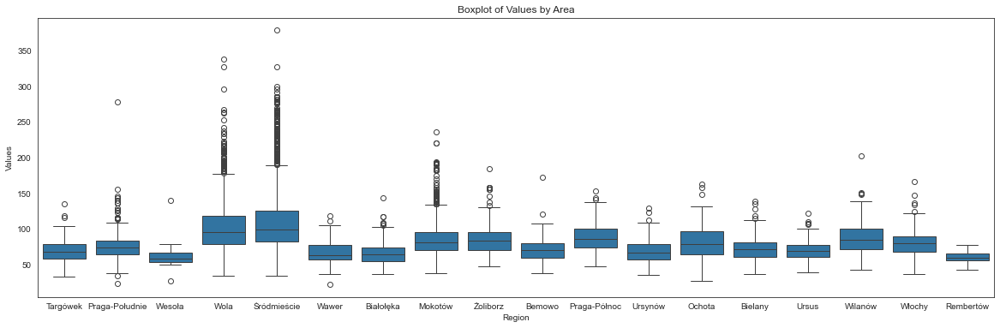

In [797]:
plt.figure(figsize=(20, 6))  
sns.boxplot(x='Neighbourhood', y='price/m', data=data)
plt.title('Boxplot of Values by Area')
plt.xlabel('Region')
plt.ylabel('Values')
plt.show()

There are a lot of outliers in some Neighbourhoods, which could influence the regression results

The results of a Shapiro-Wilk test indicate lack of normality in the price/m distribution

In [798]:
from scipy.stats import shapiro

shapiro_test_statistic, shapiro_p_value = shapiro(data["price/m"])
print("Shapiro-Wilk test statistic:", shapiro_test_statistic)
print("Shapiro-Wilk test p-value:", shapiro_p_value)

Shapiro-Wilk test statistic: 0.7969670295715332
Shapiro-Wilk test p-value: 0.0


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Checking if log transformation would normalize the data:

In [799]:
shapiro_test_statistic, shapiro_p_value = shapiro(np.log(data["price/m"]))
print("Shapiro-Wilk test statistic:", shapiro_test_statistic)
print("Shapiro-Wilk test p-value:", shapiro_p_value)

Shapiro-Wilk test statistic: 0.9644184112548828
Shapiro-Wilk test p-value: 1.7048520816920984e-38


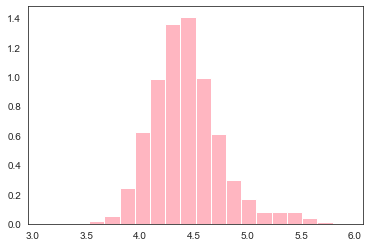

In [800]:
plt.hist(np.log(data['price/m']), color = 'lightpink', bins = 20, density = True)
plt.show()

Data looks much more normal and the test results provide a significant evidence towards it.

In [801]:
data['price/m_norm'] = np.log(data['price/m'])

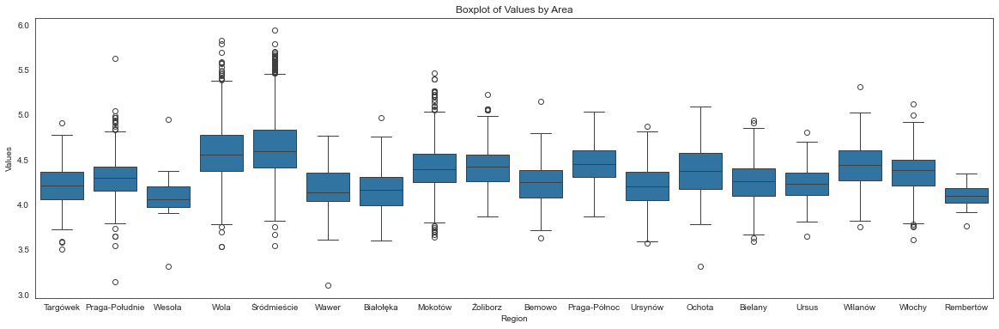

In [802]:
# Creating the boxplot
plt.figure(figsize=(20, 6))  
sns.boxplot(x='Neighbourhood', y='price/m_norm', data=data)
plt.title('Boxplot of Values by Area')
plt.xlabel('Region')
plt.ylabel('Values')
plt.show()

Filtering outliers based on Z-score:

In [804]:
#defining a function to compute z-scores for each region
def compute_zscore(group):
    return stats.zscore(group)

#Applying the compute_zscore function to each group separately
zscore_by_region = data.groupby('Neighbourhood')['price/m_norm'].transform(compute_zscore)

data["zscore_by_region"] = zscore_by_region

threshold = 3

filtered_data = data[abs(data['zscore_by_region']) <= threshold]

print(filtered_data)


     Neighbourhood    Price    Area  Rooms         Building  Floor     Rent  \
2           Wesoła   1500.0   19.00      1              NaN    0.0   2000.0   
3         Targówek   1500.0   42.00      2              NaN    5.0      NaN   
4         Targówek   1549.0   20.00      1  apartamentowiec    0.0   3000.0   
5             Wola   1650.0   22.00      1             blok    4.0      NaN   
6      Śródmieście   1650.0   18.00      1        kamienica    3.0      NaN   
...            ...      ...     ...    ...              ...    ...      ...   
7049   Śródmieście  44000.0  230.00      4             blok    9.0      NaN   
7050   Śródmieście  45000.0  160.00      4  apartamentowiec   10.0      NaN   
7051   Śródmieście  45000.0  160.00      4  apartamentowiec   10.0      NaN   
7052   Śródmieście  45000.0  160.00      4              NaN   10.0  45000.0   
7053   Śródmieście  45000.0  161.36      4  apartamentowiec   10.0  90000.0   

       Latitude  Longitude                         

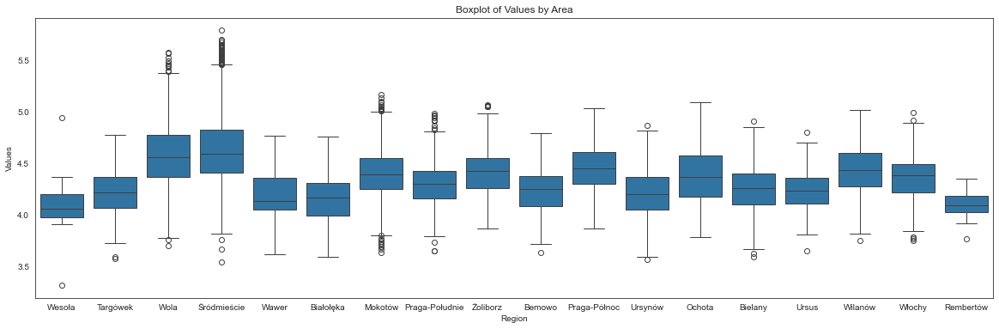

In [805]:
# Creating the boxplot
plt.figure(figsize=(20, 6))  
sns.boxplot(x='Neighbourhood', y='price/m_norm', data=filtered_data)
plt.title('Boxplot of Values by Area')
plt.xlabel('Region')
plt.ylabel('Values')
plt.show()

Encoding the Neighbourhood column in order to create separate dummy variable for each area

In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse=False)
encoded_data = encoder.fit_transform(filtered_data[['Neighbourhood']])

encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(['Neighbourhood']))

df_encoded = pd.concat([filtered_data, encoded_df], axis=1)

print(df_encoded)

Dropping all the ininformative and useless columns for futher analysis:

In [807]:
df_all = df_encoded.drop(columns = ['Building', 'Link', 'Rent'])
df_all.dropna(inplace=True)

In [875]:
df_all.columns

Index(['Neighbourhood', 'Price', 'Area', 'Rooms', 'Floor', 'Latitude',
       'Longitude', 'Adress', 'MSI', 'price/m', 'Location', 'distance_centrum',
       'distance_metro', 'distance_park', 'close_to_metro', 'close_to_park',
       'price/m_norm', 'z_scores', 'zscore_by_region', 'Neighbourhood_Bemowo',
       'Neighbourhood_Białołęka', 'Neighbourhood_Bielany',
       'Neighbourhood_Mokotów', 'Neighbourhood_Ochota',
       'Neighbourhood_Praga-Południe', 'Neighbourhood_Praga-Północ',
       'Neighbourhood_Rembertów', 'Neighbourhood_Targówek',
       'Neighbourhood_Ursus', 'Neighbourhood_Ursynów', 'Neighbourhood_Wawer',
       'Neighbourhood_Wesoła', 'Neighbourhood_Wilanów', 'Neighbourhood_Wola',
       'Neighbourhood_Włochy', 'Neighbourhood_Śródmieście',
       'Neighbourhood_Żoliborz'],
      dtype='object')

Checking the correlation between the variables:

In [867]:
import statsmodels.api as sm

X = df_all.drop(columns = ['Neighbourhood', 'Price', 'Area', 'Latitude',
       'Longitude', 'Adress', 'MSI', 'price/m', 'Location', 
       'close_to_metro', 'close_to_park', 
       'price/m_norm', 'z_scores', 'zscore_by_region', 'Neighbourhood_Bemowo' ])  
y = df_all['price/m_norm']  

Building a correlation matrix in order to check which variables we should exclude from the model

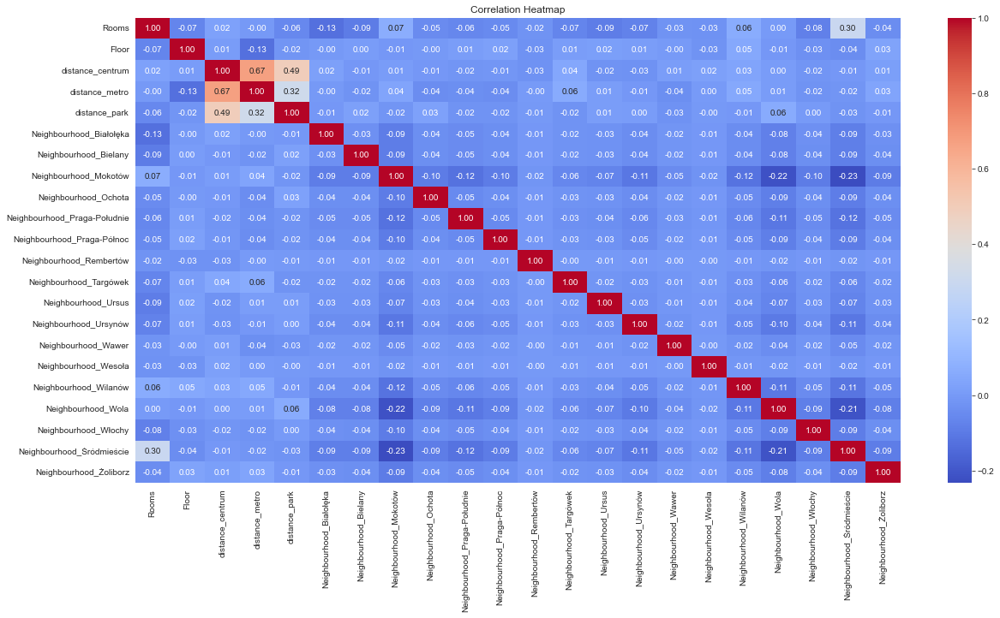

In [855]:
correlation_matrix = X.corr()

# Create heatmap
plt.figure(figsize=(20, 10))  
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Heatmap')
plt.show()

Checking if all OLS assumptions are satisfied:

A1. The linear regression model is “linear in parameters.”

A2. There is a random sampling of observations.

A3. The conditional mean should be zero.

A4. There is no multi-collinearity (or perfect collinearity).

A5. Spherical errors: There is homoscedasticity and no autocorrelation

A6: Optional Assumption: Error terms should be normally distributed.

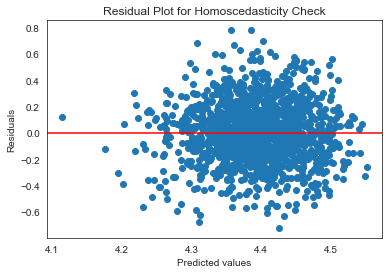

In [ ]:
X = df_all.drop(columns = ['Neighbourhood', 'Price', 'Area', 'Latitude',
       'Longitude', 'Adress', 'MSI', 'price/m', 'Location', 
       'close_to_metro', 'close_to_park', 
       'price/m_norm', 'z_scores', 'zscore_by_region', 'Neighbourhood_Bemowo' ])  
y = df_all['price/m_norm']  

X = sm.add_constant(X)

#Fitting the regression model
model = sm.OLS(y, X).fit()

residuals = model.resid
predicted = model.predict(X)

plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.title('Residual Plot for Homoscedasticity Check')
plt.axhline(y=0, color='r', linestyle='-')
plt.show()

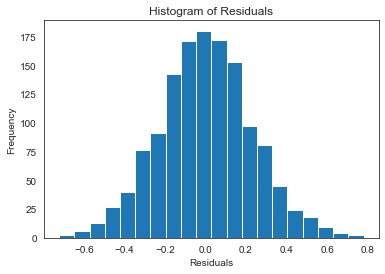

In [876]:
plt.hist(residuals, bins=20)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')
plt.show()

In [877]:
from scipy.stats import shapiro

shapiro_test_statistic, shapiro_p_value = shapiro(residuals)
print("Shapiro-Wilk test statistic:", shapiro_test_statistic)
print("Shapiro-Wilk test p-value:", shapiro_p_value)

Shapiro-Wilk test statistic: 0.9985472559928894
Shapiro-Wilk test p-value: 0.31868797540664673


Null Hypothesis (H0): The null hypothesis of the Shapiro-Wilk test is that the data is normally distributed.

Alternative Hypothesis (H1): The alternative hypothesis is that the data is not normally distributed.

Residuals are normally distributed.

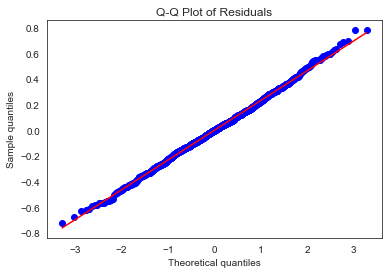

In [878]:
import scipy.stats as stats

stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical quantiles')
plt.ylabel('Sample quantiles')
plt.show()

Checking the homoskedasticity assumption:

In [882]:
from statsmodels.stats.diagnostic import het_breuschpagan

X = df_all.drop(columns = ['Neighbourhood', 'Price', 'Area', 'Latitude',
       'Longitude', 'Adress', 'MSI', 'price/m', 'Location', 
       'close_to_metro', 'close_to_park', 
       'price/m_norm', 'z_scores', 'zscore_by_region', 'Neighbourhood_Bemowo' ])  
y = df_all['price/m_norm']  

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

_, p_value, _, _ = het_breuschpagan(model.resid, X)
print("Breusch-Pagan test p-value:", p_value)

Breusch-Pagan test p-value: 0.0964060059035068


There is no significant evidnence to reject the null hypothesis of homoskedasticity, so the assumption is satisfied

In [883]:
from statsmodels.stats.stattools import durbin_watson
durbin_watson_statistic = durbin_watson(residuals)

print("Durbin-Watson Statistic:", durbin_watson_statistic)

Durbin-Watson Statistic: 1.6569798725662068


A value close to 2 indicates that there is little to no autocorrelation in the residuals. 

Multicollinearity check

In [884]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X_with_const = add_constant(X)

vif_data = pd.DataFrame()
vif_data["Variable"] = X_with_const.columns

vif_data["VIF"] = [variance_inflation_factor(X_with_const.values, i) for i in range(X_with_const.shape[1])]

print(vif_data)

                        Variable        VIF
0                          const  54.039967
1                          Rooms   1.191566
2                          Floor   1.050521
3               distance_centrum   2.222993
4                 distance_metro   1.917347
5                  distance_park   1.346327
6        Neighbourhood_Białołęka   1.918873
7          Neighbourhood_Bielany   1.957391
8          Neighbourhood_Mokotów   5.712529
9           Neighbourhood_Ochota   2.065825
10  Neighbourhood_Praga-Południe   2.701286
11    Neighbourhood_Praga-Północ   2.085354
12       Neighbourhood_Rembertów   1.046352
13        Neighbourhood_Targówek   1.481589
14           Neighbourhood_Ursus   1.625691
15         Neighbourhood_Ursynów   2.402547
16           Neighbourhood_Wawer   1.290202
17          Neighbourhood_Wesoła   1.067738
18         Neighbourhood_Wilanów   2.579431
19            Neighbourhood_Wola   5.077939
20          Neighbourhood_Włochy   2.041857
21     Neighbourhood_Śródmieście

There is no multicollinearity in the model

Printing summary of the regression

In [885]:
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           price/m_norm   R-squared:                       0.067
Model:                            OLS   Adj. R-squared:                  0.051
Method:                 Least Squares   F-statistic:                     4.311
Date:                Wed, 10 Apr 2024   Prob (F-statistic):           1.38e-10
Time:                        21:46:10   Log-Likelihood:                 60.849
No. Observations:                1353   AIC:                            -75.70
Df Residuals:                    1330   BIC:                             44.13
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

Regression results show that floor, distance to the park and distance to the metro do not have a significant impant on the rent price.
Lack of distance to the metro impact can be explained by a very good communication system in Warsaw, where metro is not that important and can be substituted with a good tram or bus connection to the center.

Distance to the city centre has a significant impact: each 1 km closer to the centre increases the price by 2.6% on average.
Number of rooms also has negativly impact price: 1 additional room lowers the price of square metre by 3.2% on average, which means that the price/square metre is higher for the smaller flats.

Dummy variables for the neighbourhoods indicate the Area impact on price, controlling for other factors:

As we can see, compared to Bemowo:  Neighbourhood_Śródmieście       12,80% more expensive,
                                    Neighbourhood_Żoliborz          11,82%,
                                    Neighbourhood_Wilanów           9,45%,
                                    Neighbourhood_Mokotów           8,61%
                                    
Other ares do not differ much from Bemowo, (controlling for the factores included above). 


There is lack of data indicating the maintanence of the flat, year built, and many other important components. Features included in the model explain only 6,7% of the overall variation. MSI has not been used in the model due to the overfitting issues.